In [156]:
import pandas as pd
import numpy as np
import cv2
from pathlib import Path
from tqdm import tqdm_notebook
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as offline
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set_style('white')

pd.set_option('precision', 5)
pd.set_option('display.float_format', lambda x: '%.5f' % x)
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)
pd.set_option('mode.chained_assignment', None)

%reload_ext autoreload
%autoreload 2

In [177]:
retrieval_solution = pd.read_csv('../input/v2_1/retrieval_solution_v2.1.csv')
retrieval_solution = retrieval_solution.sort_values('id')
retrieval_solution = retrieval_solution[retrieval_solution['images'] != 'None']

baseline = pd.read_csv('../output/baseline.csv')
step1 = pd.read_csv('../output/submit_retrieval_cossim_half.csv')
step2 = pd.read_csv('../output/submit_retrieval_cossim.csv')
# baseline = pd.read_csv('../output/alpha_QE_10.csv')
# step1 = pd.read_csv('../output/egt.csv')
# step2 = pd.read_csv('../output/submit_retrieval_cossim.csv')

baseline = baseline[baseline['id'].isin(retrieval_solution['id'])]
step1 = step1[step1['id'].isin(retrieval_solution['id'])]
step2 = step2[step2['id'].isin(retrieval_solution['id'])]

In [160]:
def frame_img_with_color(img, rgb_values=(0, 0, 230), frame_width=20):
#     img = cv2.resize(img, (int(img.shape[1] / 1.8), int(img.shape[0] / 1.8)))
    if img.shape[0] / img.shape[1] > 1.2:
        cut_width = img.shape[0] // 8
        img = img[cut_width:-cut_width]
    
    frame_width = max(img.shape[0], img.shape[1]) // 25
    frame = np.zeros((img.shape[0] + frame_width * 2,
                      img.shape[1] + frame_width * 2,
                      img.shape[2]), dtype=np.uint8)
    frame[...] = rgb_values
    frame[frame_width:-frame_width, frame_width:-frame_width, :] = img
    return frame

def visualize_retrieval_results(ranking, i_query, k=5):
    query_id = retrieval_solution['id'].iloc[i_query]
    nn_ids = ranking[ranking['id'] == query_id]['images'].str.split(' ').item()

    query_img = cv2.imread(f'../input/test19/{query_id[0]}/{query_id[1]}/{query_id[2]}/{query_id}.jpg')[:,:,::-1]
    query_img = frame_img_with_color(query_img, rgb_values=(0, 102, 204))

    fig, ax = plt.subplots(nrows=1, ncols=k+1, figsize=(2.5 * (k+1), 2.5))
    plt.subplots_adjust(wspace=0.02, hspace=0.0)
    plt.setp(ax, xticks=[], yticks=[])
    ax[0].imshow(query_img)
#     ax[0].set_title(f'{query_id}')
    ax[0].set_axis_off()

    for i, id_ in enumerate(nn_ids[:k]):
        rgb_values = (0, 204, 102) if id_ in retrieval_solution['images'].iloc[i_query] else (204, 0, 0)

        img = cv2.imread(f'../input/index19/{id_[0]}/{id_[1]}/{id_[2]}/{id_}.jpg')[:,:,::-1]
        img = frame_img_with_color(img, rgb_values=rgb_values)

        ax[i+1].imshow(img)
#         ax[i+1].set_title(f'[k={i+1}] {id_}')
        ax[i+1].set_axis_off()

成功例: 6, 42, 76, 97, 223
失敗例: 11, 23, 26

比較いい例：8,15,19,40,223

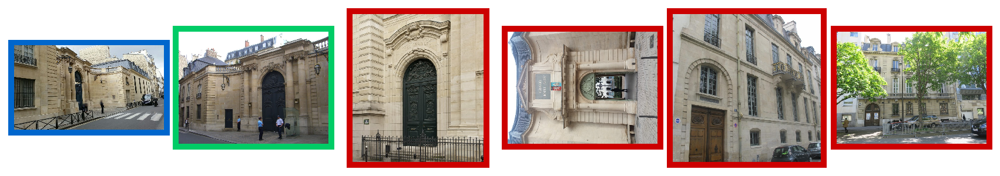

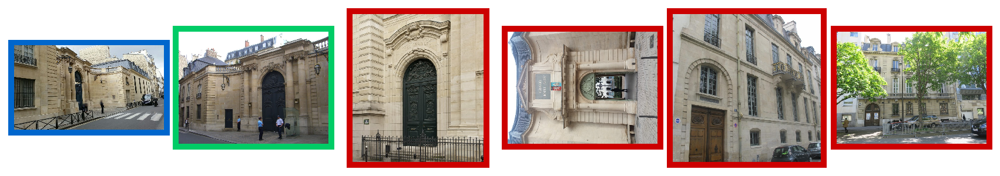

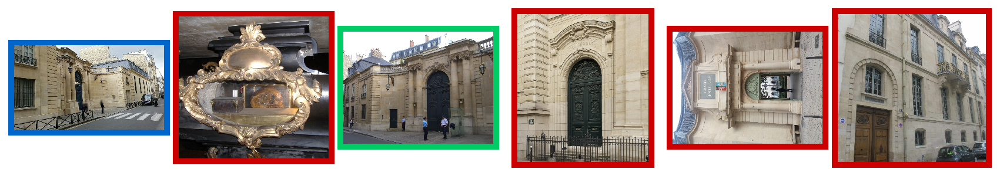

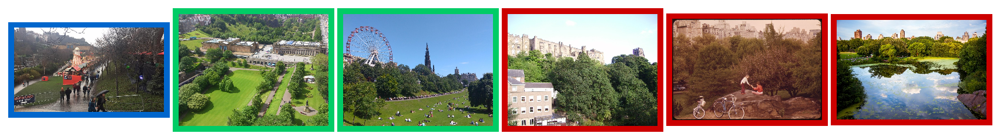

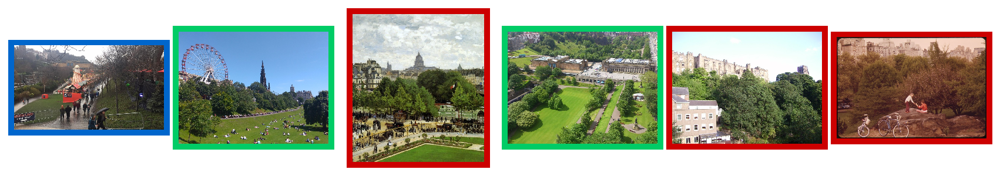

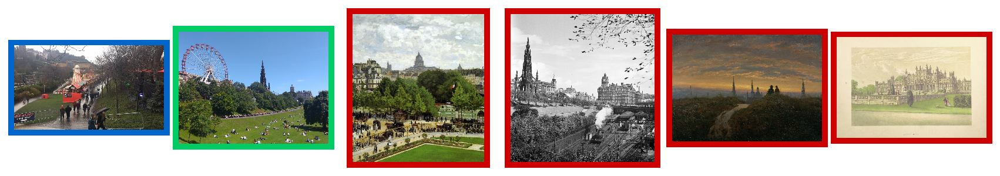

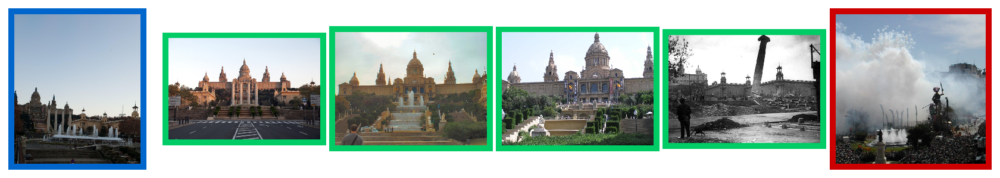

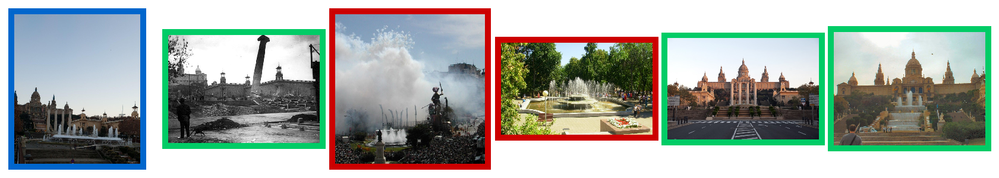

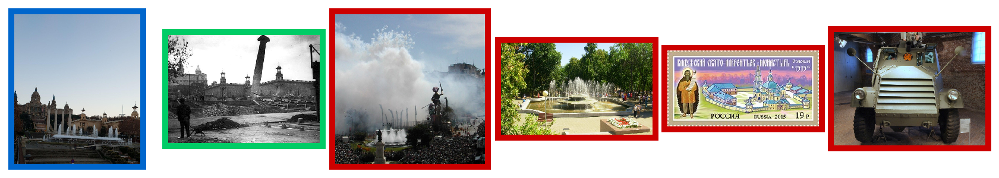

In [178]:
i_query, k = 1, 5
for i_query in [11,23,26]:
    visualize_retrieval_results(baseline, i_query=i_query, k=k)
    visualize_retrieval_results(step1, i_query=i_query, k=k)
    visualize_retrieval_results(step2, i_query=i_query, k=k)

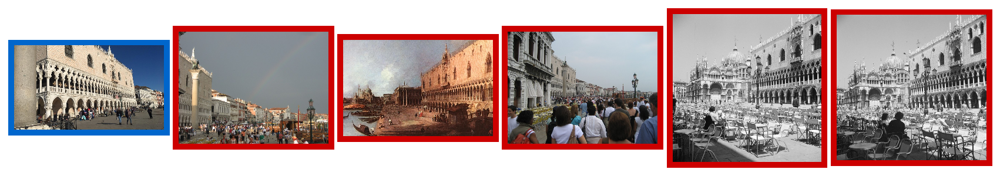

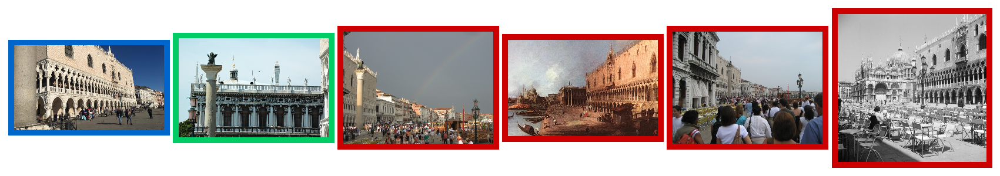

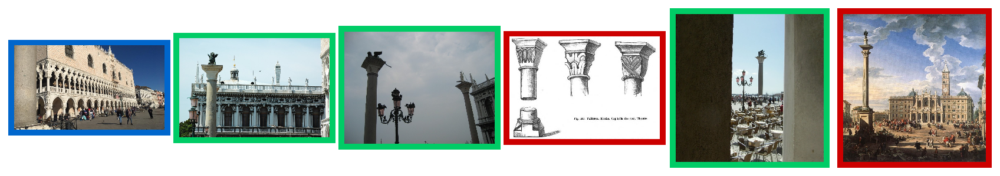

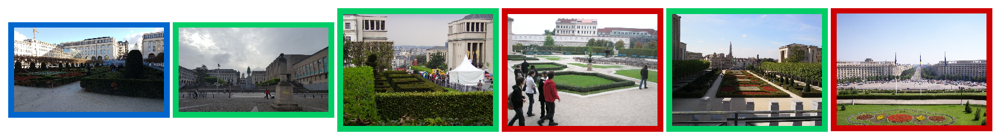

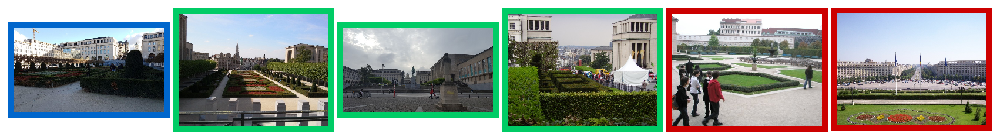

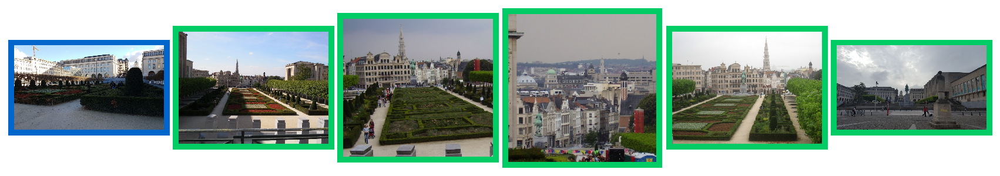

In [154]:
i_query, k = 1, 5
for i_query in [6, 42]:
    visualize_retrieval_results(baseline, i_query=i_query, k=k)
    visualize_retrieval_results(step1, i_query=i_query, k=k)
    visualize_retrieval_results(step2, i_query=i_query, k=k)

In [182]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '4,5'
from collections import Counter
import faiss
import tqdm
import numpy as np
import pandas as pd
import subprocess
from src import utils
# from experiments.submit_retrieval import predict_landmark_id

ROOT = '../'

def predict_landmark_id(ids_query, feats_query, ids_train, feats_train, landmark_dict, topk=3):
    co = faiss.GpuMultipleClonerOptions()
    co.shard = True

    vres = []
    for _ in range(2):
        res = faiss.StandardGpuResources()
        vres.append(res)
    
    print('build index...')
    cpu_index = faiss.IndexFlatIP(feats_train.shape[1])
    gpu_index = faiss.index_cpu_to_gpu_multiple_py(vres, cpu_index, co)
    gpu_index.add(feats_train)
    sims, topk_idx = gpu_index.search(x=feats_query, k=topk)
    print('query search done.')

    df = pd.DataFrame(ids_query, columns=['id'])
    df['images'] = np.apply_along_axis(' '.join, axis=1, arr=ids_train[topk_idx])

    rows = []
    for imidx, (_, r) in tqdm.tqdm(enumerate(df.iterrows()), total=len(df)):
        image_ids = [name.split('/')[-1] for name in r.images.split(' ')]
        counter = Counter()
        for i, image_id in enumerate(image_ids[:topk]):
            landmark_id = landmark_dict[image_id]

            counter[landmark_id] += sims[imidx, i]

        landmark_id, score = counter.most_common(1)[0]
        rows.append({
            'id': r['id'],
            'landmarks': f'{landmark_id} {score:.9f}',
        })

    pred = pd.DataFrame(rows).set_index('id')
    pred['landmark_id'], pred['score'] = list(
        zip(*pred['landmarks'].apply(lambda x: str(x).split(' '))))
    pred['score'] = pred['score'].astype(np.float32)

    return pred

In [180]:
index_dirs = ['../experiments/v2clean/feats_index19_ms_L2_ep4_freqthresh-3_loss-arcface_verifythresh-30/']
test_dirs = ['../experiments/v2clean/feats_test19_ms_L2_ep4_freqthresh-3_loss-arcface_verifythresh-30/']
train_dirs = ['../experiments/v2clean/feats_train_ms_L2_ep4_freqthresh-3_loss-arcface_verifythresh-30/']

weights = [1.0]

ids_index, feats_index = utils.prepare_ids_and_feats(index_dirs, weights, normalize=True)
ids_test, feats_test = utils.prepare_ids_and_feats(test_dirs, weights, normalize=True)
ids_train, feats_train = utils.prepare_ids_and_feats(train_dirs, weights, normalize=True)

print('build index...')
cpu_index = faiss.IndexFlatIP(feats_index.shape[1])
gpu_index = faiss.index_cpu_to_all_gpus(cpu_index)
gpu_index.add(feats_index)
sims, topk_idx = gpu_index.search(x=feats_test, k=100)
print('query search done.')

subm = pd.DataFrame(ids_test, columns=['id'])
subm['images'] = np.apply_along_axis(' '.join, axis=1, arr=ids_index[topk_idx])

build index...
query search done.


In [ ]:
score_thresh=0.0
topk=100

train19_csv = pd.read_pickle(ROOT + 'input/train.pkl')[['id', 'landmark_id']]
landmark_dict = train19_csv.set_index('id').sort_index().to_dict()['landmark_id']

pred_index = predict_landmark_id(ids_index, feats_index, ids_train, feats_train, landmark_dict, topk=3)
pred_test = predict_landmark_id(ids_test, feats_test, ids_train, feats_train, landmark_dict, topk=3)

build index...


In [5]:
assert np.all(subm['id'] == pred_test.index)
subm['index_id_list'] = subm['images'].apply(lambda x: x.split(' ')[:topk])

# Make higher score, ealier position for re-ranking.
pred_index = pred_index.sort_values('score', ascending=False)

In [ ]:
images = []
vis_test_ids = []
for test_id, pred, ids in tqdm.tqdm(zip(subm['id'], pred_test['landmark_id'], subm['index_id_list']),
                                    total=len(subm)):
    retrieved_list = pred_index.loc[ids, 'landmark_id']
    whole_ids_same = pred_index[pred_index['landmark_id'] == pred].index
    diff = sorted(set(whole_ids_same) - set(ids), key=whole_ids_same.get_loc)
    retrieved_list = pd.concat([
        retrieved_list,
        pd.Series(pred, index=diff)
    ])

    # use mergesort to keep relative order of original list.
    predefined_limit_topk = 100
    reranked_ids = (pred != retrieved_list).sort_values(kind='mergesort').index[:predefined_limit_topk]
    images.append(' '.join(reranked_ids))
    
    if reranked_ids[0] == ids[0] and np.isin(reranked_ids[:5], diff).any():
        vis_test_ids.append(test_id)

 74%|███████▎  | 86528/117577 [2:57:58<1:02:17,  8.31it/s]

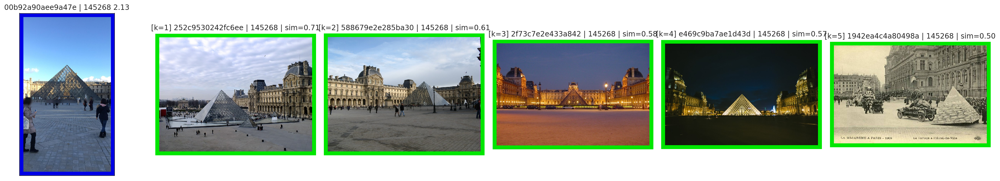

In [33]:
query_id = vis_test_ids[15]
pred_lid_query = pred_test.loc[query_id, "landmark_id"]

nn_ids = subm[subm['id'] == query_id]['images'].str.split(' ').item()
nn_sims = sims[subm[subm['id'] == query_id].index.item()]

query_img = cv2.imread(f'../input/test19/{query_id[0]}/{query_id[1]}/{query_id[2]}/{query_id}.jpg')[:,:,::-1]
query_img = frame_img_with_color(query_img, rgb_values=(0, 0, 230))

k = 5
fig, ax = plt.subplots(ncols=k+1, figsize=(5 * (k+1), 5))
plt.subplots_adjust(wspace=0.05, hspace=0.0)
plt.setp(ax, xticks=[], yticks=[])
ax[0].imshow(query_img)
ax[0].set_title(f'{query_id} | {pred_lid_query} {pred_test.loc[query_id, "score"]:.2f}')

for i, id_ in enumerate(nn_ids[:k]):
    pred_lid_nn = pred_index.loc[id_, "landmark_id"]
    rgb_values = (0, 230, 0) if pred_lid_nn == pred_lid_query else (230, 0, 0)
    
    img = cv2.imread(f'../input/index19/{id_[0]}/{id_[1]}/{id_[2]}/{id_}.jpg')[:,:,::-1]
    img = frame_img_with_color(img, rgb_values=rgb_values)
    
    ax[i+1].imshow(img)
    ax[i+1].set_title(f'[k={i+1}] {id_} | {pred_lid_nn} | sim={nn_sims[i]:.2f}')
    ax[i+1].set_axis_off()

In [29]:
reranked = subm
reranked['images'] = images

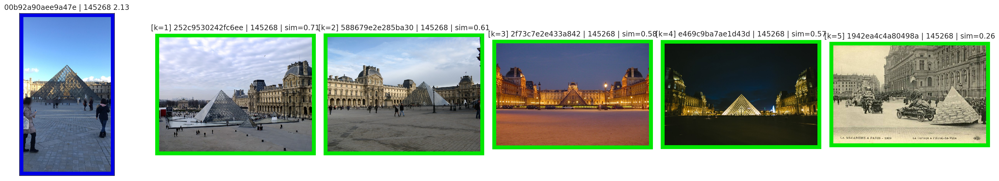

In [30]:
query_id = vis_test_ids[15]
pred_lid_query = pred_test.loc[query_id, "landmark_id"]

nn_ids = reranked[reranked['id'] == query_id]['images'].str.split(' ').item()
qfeat = feats_test[reranked[reranked['id'] == query_id].index.item()]

query_img = cv2.imread(f'../input/test19/{query_id[0]}/{query_id[1]}/{query_id[2]}/{query_id}.jpg')[:,:,::-1]
query_img = frame_img_with_color(query_img, rgb_values=(0, 0, 230))

k = 5
fig, ax = plt.subplots(ncols=k+1, figsize=(5 * (k+1), 5))
plt.subplots_adjust(wspace=0.05, hspace=0.0)
plt.setp(ax, xticks=[], yticks=[])
ax[0].imshow(query_img)
ax[0].set_title(f'{query_id} | {pred_lid_query} {pred_test.loc[query_id, "score"]:.2f}')

for i, id_ in enumerate(nn_ids[:k]):
    pred_lid_nn = pred_index.loc[id_, "landmark_id"]
    rgb_values = (0, 230, 0) if pred_lid_nn == pred_lid_query else (230, 0, 0)
    
    img = cv2.imread(f'../input/index19/{id_[0]}/{id_[1]}/{id_[2]}/{id_}.jpg')[:,:,::-1]
    img = frame_img_with_color(img, rgb_values=rgb_values)
                
    ifeat = feats_index[np.where(id_ == ids_index)[0].item()]
    cossim = qfeat @ ifeat
    
    ax[i+1].imshow(img)
    ax[i+1].set_title(f'[k={i+1}] {id_} | {pred_lid_nn} | sim={cossim:.2f}')
    ax[i+1].set_axis_off()

In [ ]:
nrows, ncols = 5, 5
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4 * ncols, 4 * nrows))
plt.axis('off')
ax = ax.flatten()
for i, id_ in enumerate(nn_ids[:nrows*ncols]):
    img = cv2.imread(f'../input/index19/{id_[0]}/{id_[1]}/{id_[2]}/{id_}.jpg')[:,:,::-1]
    frame_img_with_color(img, rgb_values=)
    ax[i].imshow(img)
    ax[i].set_title(f'[{i}] {index_train.loc[id_, "landmark_id"]} {index_train.loc[id_, "score"]:.3f}')
#     ax[i].set_title(f'[{i}] index: {id_} | {index_train.loc[id_, "landmark_id"]} {index_train.loc[id_, "score"]:.3f}')
    ax[i].set_xticks([])
    ax[i].set_yticks([])

In [26]:
import pandas as pd
from io import StringIO
results = pd.read_csv(StringIO(
    """
    0.28477,82.26,65.1,89.87,79.51
    0.275,81.18,62.86,89.25,78.28
    0.27569,78.41,62.49,89.87,79.39
    0.29039,82.82,64.82,89.64,79.07
    0.29601,80.11,61.82,90.22,79.57
    0.27981,78.33,60.27,89.34,78.99
    0.28569,81.18,62.62,88.56,77.63
    0.28325,80.9,63.06,88.83,77.91
    0.2866,80.2,65.7,89.56,78.58
    """
), header=None)
results.columns = ['LB', 'ROxford5k-M', 'ROxford5k-H', 'RParis6k-M', 'RParis6k-H']

In [8]:
table[['verifythresh', 'freqthresh', 'Private LB', 'roxford5k-mapM', 'roxford5k-mapH', 'rparis6k-mapM', 'rparis6k-mapH']].corr()[[
    'Private LB', 'roxford5k-mapM', 'roxford5k-mapH', 'rparis6k-mapM', 'rparis6k-mapH'
]]

,Private LB,roxford5k-mapM,roxford5k-mapH,rparis6k-mapM,rparis6k-mapH
verifythresh,-0.586527,-0.462511,-0.313919,-0.584112,-0.607635
freqthresh,-0.693348,-0.730779,-0.630989,-0.751273,-0.733695
Private LB,1.000000,0.795783,0.723519,0.889355,0.897557
roxford5k-mapM,0.795783,1.000000,0.830534,0.795726,0.800756
roxford5k-mapH,0.723519,0.830534,1.000000,0.646619,0.671085
rparis6k-mapM,0.889355,0.795726,0.646619,1.000000,0.992428
rparis6k-mapH,0.897557,0.800756,0.671085,0.992428,1.000000


In [1]:
import pandas as pd
from tabulate import tabulate

table = pd.read_csv(f'../experiments/v2clean/tuning/results.csv')
table.head()

,freqthresh,verifythresh,# Samples,# Labels,Private LB,Public LB,oxford5k,paris6k,roxford5k-mapE,roxford5k-mapM,roxford5k-mapH,rparis6k-mapE,rparis6k-mapM,rparis6k-mapH
0,10,50,17036,430801,27.24,24.21,93.41,94.43,89.90,75.81,57.42,91.70,84.77,71.61
1,10,40,20519,540023,27.85,25.06,92.85,94.13,88.99,75.39,56.31,91.99,85.02,71.89
2,10,30,25974,725167,28.56,26.16,92.89,94.54,88.07,75.22,56.49,92.47,86.47,74.09
3,10,20,35084,1094854,29.23,26.29,90.86,96.06,87.81,75.13,56.35,93.03,88.12,76.52
4,9,50,19627,474639,27.30,24.81,93.97,95.06,88.57,75.37,55.46,92.08,85.45,72.07


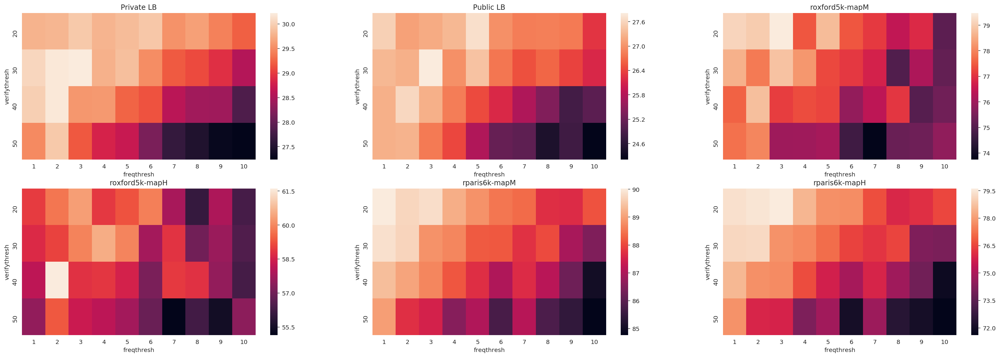

In [37]:
cols = ('Private LB', 'Public LB', 'roxford5k-mapM', 'roxford5k-mapH', 'rparis6k-mapM', 'rparis6k-mapH')
fig, ax = plt.subplots(2, 3, figsize=(30, 10))
ax = ax.flatten()
for i, col in enumerate(cols):
    pivot = table.pivot('verifythresh', 'freqthresh', col)
    sns.heatmap(pivot, ax=ax[i])
    ax[i].set_title(col)

Text(0.5, 1.0, 'distribution of cosine similarity')

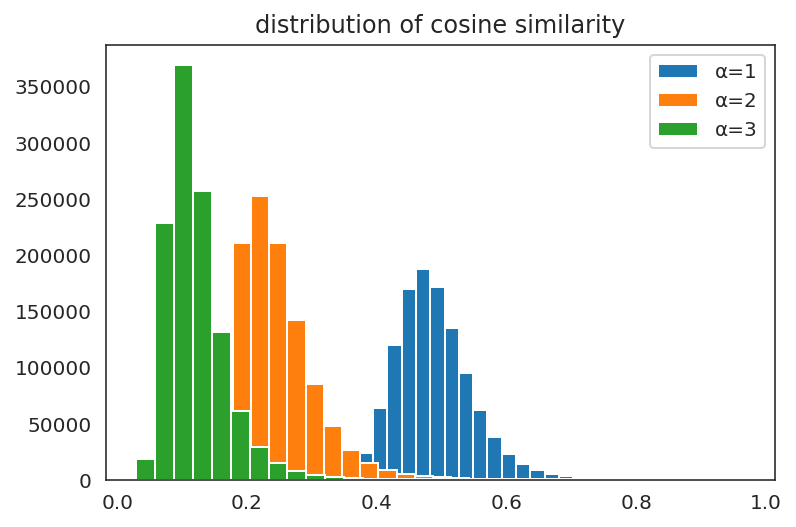

In [43]:
plt.hist(dists[:, :10].flatten()**1, bins=30, label="α=1");
plt.hist(dists[:, :10].flatten()**2, bins=30, label="α=2");
plt.hist(dists[:, :10].flatten()**3, bins=30, label="α=3");
plt.legend()
plt.title('distribution of cosine similarity')

In [5]:
import json
import math
import os
import re
import time
from pathlib import Path

import click
import h5py
import numpy as np
from sklearn.model_selection import ParameterGrid, ParameterSampler
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data
from tqdm import tqdm

from src import qsub
from src import utils, data_utils, metrics
from src.modeling import models
from src.eval_retrieval import eval_datasets

# ROOT = os.path.dirname(os.path.dirname(os.path.abspath(__file__))) + '/'

params = {
#     'ex_name': __file__.replace('.py', ''),
    'seed': 123456789,
    'lr': 1e-3,
    'batch_size': 32,
    'test_batch_size': 64,
    'optimizer': 'momentum',
    'epochs': 5,
    'finetuning_epochs': 0,
    'wd': 1e-5,
    'model_name': 'fishnet150',
    'pooling': 'G,G,G,G',
    # 'class_topk': 39129,
    'use_fc': True,
    'loss': 'arcface',
    'margin': 0.3,
    's': 30,
    'fc_dim': 512,
    'scale_limit': 0.3,
    'shear_limit': 0,
    'rotate_limit': 0,
    'brightness_limit': 0.0,
    'contrast_limit': 0.0,
    'clahe_p': 0.0,
    'blur_p': 0.0,
    'augmentation': 'soft',
    'data': 'train',
    'freeze_bn': False,
    'verified_path': '/fs2/groups2/gca50080/sp4/working/exp12/train19_cleaned_verifythresh50_freqthresh5.csv',
    'base_ckpt_path': '/fs2/group2/gca50080/yokoo/landmark/experiments/v7/ep4_batch_size-32_epochs-5_pooling-G,G,G,G.pth',
}

model_path = '../experiments/v7/ep4_batch_size-32_epochs-5_pooling-G,G,G,G.pth'
devices = '4,5'
batch_size = 32

os.environ['CUDA_VISIBLE_DEVICES'] = devices

ckpt = torch.load(model_path)
params, state_dict = ckpt['params'], ckpt['state_dict']
params['test_batch_size'] = batch_size

model = models.LandmarkFishNet(n_classes=params['class_topk'],
                               model_name=params['model_name'],
                               pooling_strings=params['pooling'].split(','),
#                                loss_module=params['loss'],
                               loss_module='arcface',
#                                s=params['s'],
#                                margin=params['margin'],
                               use_fc=params['use_fc'],
                               fc_dim=params['fc_dim'],
                               )
model.load_state_dict(state_dict)
model = model.to('cuda').eval()

In [36]:
import torch
from torch.utils.data import sampler, DataLoader
from src import data_utils
from src.torch_custom import GroupedBatchSampler, IterationBasedBatchSampler, WeightedRandomSampler
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

seed = 7777
data_root = '../input/train2018_r800'
class_topk = 14950
num_workers=1

In [37]:
params = {
    'seed': 123456789,
    'lr': 1e-3,
    'batch_size': 32,
    'test_batch_size': 64,
    'optimizer': 'momentum',
    'epochs': 5,
    'wd': 1e-5,
    'model_name': 'resnet50',
    'pooling': 'GeM',
    'class_topk': 14951,
    'use_fc': True,
    'margin': 0.3,
    'fc_dim': 512,
    'scale_limit': 0.3,
    'finetuning_epoch': -1,
}
data_loaders = data_utils.make_predict_loaders(params, scale='L')

In [38]:
df = data_utils.prepare_recognition_df(df_path=data_root + '.pkl',
                            class_topk=class_topk,
                            least_freq_thresh=-1,
                            limit_samples_per_class=-1,
                            seed=seed)

df['paths'] = df['id'].apply(lambda x: data_root + f'/{x}.jpg')

df['aspect_ratio'] = df['height'] / df['width']
df['aspect_gid'] = data_utils._quantize(df['aspect_ratio'], bins=[0.77, 1.33])

# freq = df['landmark_id'].value_counts().to_frame()
# weights_per_class = 1.0 / (np.log1p(freq))
# weights_per_class.columns = ['weights']
# df = df.merge(weights_per_class, left_on='landmark_id', right_index=True)

train_split, val_split = train_test_split(df, test_size=0.0, random_state=seed)

train_transform, eval_transform = data_utils.build_transforms()
dataset = data_utils.LandmarkDataset(paths=train_split['paths'].values,
                                     class_ids=train_split['class_id'].values,
                                     scale='M',
                                     aspect_gids=train_split['aspect_gid'].values,
                                     transform=train_transform)
# import pdb; pdb.run('dataset.__getitem__(26)')

In [80]:
from torch.utils.data.sampler import Sampler
from torch.utils.data import sampler, DataLoader
class PseudoTripletSampler(Sampler):

    def __init__(self, class_ids, k=4):
        self.class_ids = class_ids
        self.k = k

    def __iter__(self):
        upper = len(self.class_ids) - len(self.class_ids) % k
        first_indexes = np.random.permutation(np.arange(0, upper, self.k))
        rand_indexes = np.concatenate(np.array([first_indexes + i for i in range(k)]).T)
        return iter(np.argsort(self.class_ids)[rand_indexes])
    
    def __len__(self):
        return len(self.class_ids)

In [83]:
# random_sampler = WeightedRandomSampler(
#     train_split['weights'], len(df) // 3, replacement=False)

random_sampler = PseudoTripletSampler(class_ids=train_split['class_id'].values, k=4)
# batch_sampler = sampler.BatchSampler(random_sampler, batch_size=32, drop_last=True)
# batch_sampler = IterationBasedBatchSampler(batch_sampler, num_iterations=3, start_iter=0)
batch_sampler = GroupedBatchSampler(sampler=random_sampler,
                                 group_ids=train_split['aspect_gid'].values,
                                 batch_size=32,
                                 drop_uneven=True)
loader = DataLoader(dataset=dataset,
                   batch_sampler=batch_sampler,
                   pin_memory=True,
                   num_workers=num_workers)

In [18]:
for batch in loader:
    print(batch[1].shape)

torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])
torch.Size([32, 3, 224, 224])


In [3]:
import torch
from src.FishNet import models
from src import utils

model = models.__dict__['fishnet150']()
x = torch.rand(1, 3, 224, 224)
y = model.features(x)
[y_.shape for y_ in y]

/opt/conda/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:129: UserWarning: nn.Upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.{} is deprecated. Use nn.functional.interpolate instead.".format(self.name))


[torch.Size([1, 320, 56, 56]),
 torch.Size([1, 832, 28, 28]),
 torch.Size([1, 1600, 14, 14]),
 torch.Size([1, 2112, 7, 7])]

In [4]:
space = {
    'scale_limit': [0.4],
    'rotate_limit': [0, 10],
    'shear_limit': [0, 4],
    #         'brightness_limit': [0.0],
    #         'contrast_limit': [0.0],
    'rgb_shift': [0, 10, 20],
    'clahe_p': [0]
}
from sklearn.model_selection import ParameterGrid

candidate_list = list(ParameterGrid(space))

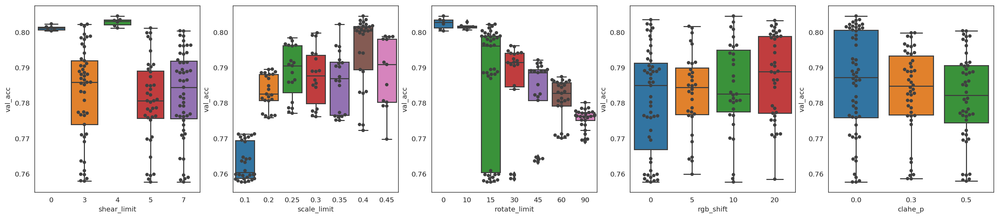

In [5]:
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(25, 5))
for i, attr in enumerate(res.columns[:-4]):
    sns.boxplot(x=attr, y='val_acc', data=res, ax=ax[i])
    sns.swarmplot(x=attr, y='val_acc', data=res, color=".25", ax=ax[i])

In [8]:
import pandas as pd
import numpy as np
import cv2
from pathlib import Path
from tqdm import tqdm_notebook
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as offline
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sns.set_style('white')

pd.set_option('precision', 5)
pd.set_option('display.float_format', lambda x: '%.5f' % x)
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)
pd.set_option('mode.chained_assignment', None)

%reload_ext autoreload
%autoreload 2

In [8]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "7,"
import cv2
import pandas as pd
import numpy as np
import bisect
from tqdm import tqdm
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

root = '/opt/landmark/'
num_workers = 8
bs = 128
index = pd.read_pickle(f'../input/index19.pkl').sort_values(by=['width', 'height'])
test = pd.read_pickle(f'../input/test19.pkl').sort_values(by=['width', 'height'])

In [ ]:
train = pd.read_pickle('../input/train.pkl')
vis = train.query('landmark_id == 7223')['id']

nrows, ncols = 36, 5
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4 * ncols, 4 * nrows))
plt.axis('off')
ax = ax.flatten()
for i, id_ in enumerate(vis[:nrows*ncols]):
    img = cv2.imread(f'../input/train/{id_[0]}/{id_[1]}/{id_[2]}/{id_}.jpg')[:,:,::-1]
    ax[i].imshow(img)
#     ax[i].set_title(f'[{i}] {test_train.loc[id_, "landmark_id"]} {test_train.loc[id_, "score"]:.3f}')
    ax[i].set_xticks([])
    ax[i].set_yticks([])

In [10]:
df = pd.read_csv('../output/baseline.csv')

NameError: name 'test_train' is not defined

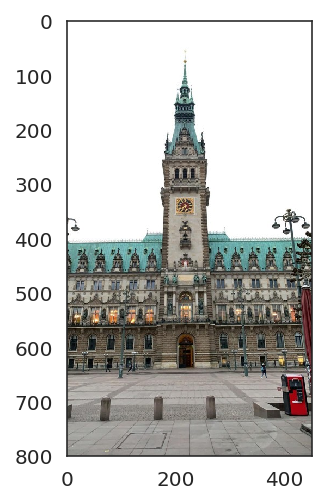

In [11]:
# query_id = '33ed6436c8ae701b'  # 神聖なドームっぽいもの
query_id = '0ff22436452d101e'  # ハンブルグ市庁舎
nn_ids = df[df['id'] == query_id]['images'].str.split(' ').item()
query_img = cv2.imread(f'../input/test19/{query_id[0]}/{query_id[1]}/{query_id[2]}/{query_id}.jpg')[:,:,::-1]
plt.imshow(query_img)
plt.title(f'test: {query_id} | {test_train.loc[query_id, "landmarks"]}')

nrows, ncols = 5, 5
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4 * ncols, 4 * nrows))
plt.axis('off')
ax = ax.flatten()
for i, id_ in enumerate(nn_ids[:nrows*ncols]):
    img = cv2.imread(f'../input/index19/{id_[0]}/{id_[1]}/{id_[2]}/{id_}.jpg')[:,:,::-1]
    ax[i].imshow(img)
    ax[i].set_title(f'[{i}] {index_train.loc[id_, "landmark_id"]} {index_train.loc[id_, "score"]:.3f}')
#     ax[i].set_title(f'[{i}] index: {id_} | {index_train.loc[id_, "landmark_id"]} {index_train.loc[id_, "score"]:.3f}')
    ax[i].set_xticks([])
    ax[i].set_yticks([])

In [120]:
train = pd.read_pickle('../input/train.pkl')
index = pd.read_pickle('../input/index19.pkl')
test = pd.read_pickle('../input/test19.pkl')

In [133]:
lid_freq = test_train.landmark_id.value_counts()
ban_lids = lid_freq[lid_freq > 250]
ban_ids = test_train[test_train['landmark_id'].isin((ban_lids).index)].index

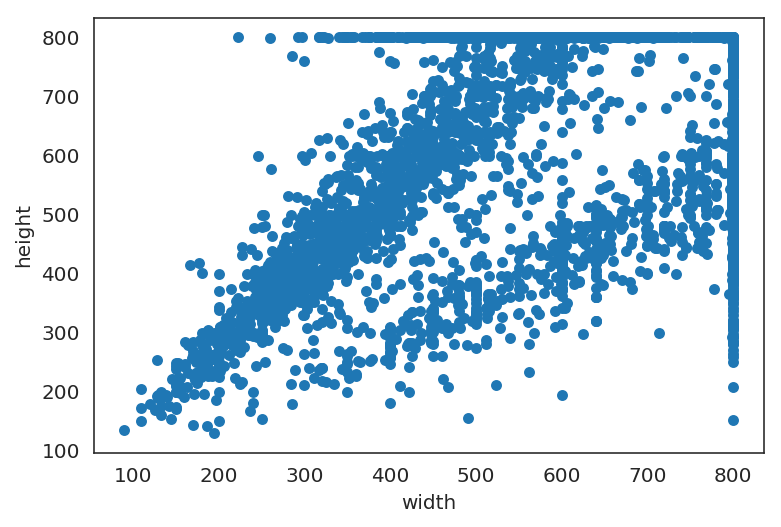

In [161]:
test[test['id'].isin(ban_ids)].plot(x='width', y='height', kind='scatter')

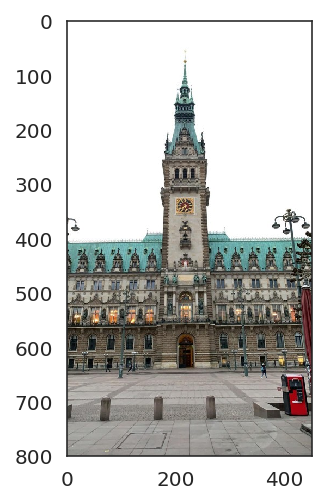

In [8]:
id_ = '0ff22436452d101e'
img = cv2.imread(f'../input/test19/{id_[0]}/{id_[1]}/{id_[2]}/{id_}.jpg')[:,:,::-1]
plt.imshow(img)